<a href="https://colab.research.google.com/github/freefrit/pytorch-metric-learning/blob/master/Robotic%20Pick-and-Place/inference_image_matching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# PyTorch Metric Learning
See the documentation [here](https://kevinmusgrave.github.io/pytorch-metric-learning/)

## Install the packages

In [1]:
!pip install pytorch-metric-learning
!pip install -q faiss-gpu

## Import the packages

In [2]:
%matplotlib inline
from pytorch_metric_learning.utils.inference import MatchFinder, InferenceModel
from pytorch_metric_learning.distances import CosineSimilarity
from pytorch_metric_learning.utils import common_functions as c_f
from torchvision import datasets, transforms
import torchvision
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image

# Packages for preparing dataset
import json
from torch.utils.data import Dataset, DataLoader

In [3]:
from google.colab import drive
import os
drive.mount('/content/gdrive')
root = '/content/gdrive/My Drive/Metric_Learning/image-matching-dataset'

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Create helper functions

In [4]:
def print_decision(is_match):
    if is_match:
        print("Same class")
    else:
        print("Different class")

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

inv_normalize = transforms.Normalize(
   mean= [-m/s for m, s in zip(mean, std)],
   std= [1/s for s in std]
)

def imshow(img, figsize=(8, 4)):
    img = inv_normalize(img)
    npimg = img.numpy()
    plt.figure(figsize = figsize)
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

## Create the dataset

In [5]:
class image_matching_datasets_in_CIFAR(Dataset):
  def __init__(self, root, train = True, transform = None):
    """
    Dataset Init-Function.
    Args:
        root: the root of the dataset.
        train: declear that the dataset is training or testing.
        transform: the image transform mode you have to set before.
    Returns:
        Nothing!
    """
    super(image_matching_datasets_in_CIFAR, self).__init__()
    self.train = train
    self.transform = transform

    # if training, load the training annotation file, else load the testing one.
    # the .json file stores the info of annotation in dict shape: 
    #   {'image': filenames, 'label': annotations} where filenames and annotations are arrays.
    if self.train:
      file_annotation = root + '/annotations/image-matching_train_new.json'
    else:
      file_annotation = root + '/annotations/image-matching_test_new.json'
    self.img_folder = root

    # read the file and check if the length of filenames and annotations are same.
    fp = open(file_annotation,'r')
    data_dict = json.load(fp)
    assert len(data_dict['image']) == len(data_dict['label'])
    num_data = len(data_dict['image'])
    fp.close()

    # put the filenames into self.datanames, their annotations into self.targets.
    self.datanames = []
    self.targets = []
    for i in range(num_data):
      self.datanames.append(data_dict['image'][i])
      self.targets.append(data_dict['label'][i])

  def __getitem__(self, index):
    """
    Dataset Getitem-Function.
    Returns:
        img: the data image.
        target: the label num of the data. 
    """
    img_path = self.img_folder + self.datanames[index]
    target = self.targets[index]

    img = Image.open(img_path)
    img = img.convert("RGB")
    
    if self.transform is not None:
      img = self.transform(img)

    return img, target

  def __len__(self):
        return len(self.datanames)


## Simple model def

In [6]:
class MLP(nn.Module):
    # layer_sizes[0] is the dimension of the input
    # layer_sizes[-1] is the dimension of the output
    def __init__(self, layer_sizes, final_relu=False):
        super().__init__()
        layer_list = []
        layer_sizes = [int(x) for x in layer_sizes]
        num_layers = len(layer_sizes) - 1
        final_relu_layer = num_layers if final_relu else num_layers - 1
        for i in range(len(layer_sizes) - 1):
            input_size = layer_sizes[i]
            curr_size = layer_sizes[i + 1]
            if i < final_relu_layer:
                layer_list.append(nn.ReLU(inplace=False))
            layer_list.append(nn.Linear(input_size, curr_size))
        self.net = nn.Sequential(*layer_list)
        self.last_linear = self.net[-1]

    def forward(self, x):
        return self.net(x)

## Create the dataset and load the trained model

In [7]:
transform = transforms.Compose([transforms.Resize(128),
                  transforms.CenterCrop(128),
                  transforms.ToTensor(),
                  transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                  ])
"""
Create the dataset
1. You must download SOP dataset and put it in the path ~/metric-learning/ inside Docker.
2. Also, the .json file (OnlineProducts_train_new.json, OnlineProducts_test_new.json)
  must be in the path ~/metric-learning/SOP_dataset/annotations/ inside Docker.
3. All of the files above are avaliable in https://drive.google.com/drive/folders/1yrYKT8DTaCFYJFnDma1XSKYT8YJtU0ws?usp=sharing
"""
%cd
my_root = '/content/gdrive/My Drive/Metric_Learning/image-matching-dataset/'
trunk_path = '/content/gdrive/MyDrive/Metric_Learning/model_data/example_saved_models/trunk_best92.pth'
embedder_path = '/content/gdrive/MyDrive/Metric_Learning/model_data/example_saved_models/embedder_best92.pth'
dataset = image_matching_datasets_in_CIFAR(root = my_root, train = False, transform = transform)

"""
Creates labels_to_indices, which is a dictionary mapping each label
to a numpy array of indices that will be used to index into self.dataset
"""
labels_to_indices = c_f.get_labels_to_indices(dataset.targets)

/root


In [8]:
# Set trunk model and replace the softmax layer with an identity function
trunk = torchvision.models.resnet50()
trunk_output_size = trunk.fc.in_features
trunk.fc = c_f.Identity()
# Load the trained trunk
trunk.load_state_dict(torch.load(trunk_path))
trunk = torch.nn.DataParallel(trunk.to(torch.device("cuda")))
print("done trunk loading")

# Set embedder model. This takes in the output of the trunk and outputs 32 dimensional embeddings
embedder = MLP([trunk_output_size, 32])
# Load the trained embedder
embedder.load_state_dict(torch.load(embedder_path))
embedder = torch.nn.DataParallel(embedder.to(torch.device("cuda")))
print("done embedder loading")

done trunk loading
done embedder loading


## Create the InferenceModel wrapper

In [35]:
match_finder = MatchFinder(distance=CosineSimilarity(), threshold=0.7)
inference_model = InferenceModel(trunk=trunk, embedder=embedder, match_finder=match_finder)

classA, classB = labels_to_indices[1], labels_to_indices[56]

## Get nearest neighbors of a query

In [36]:
# create faiss index
inference_model.train_indexer(dataset)

query image


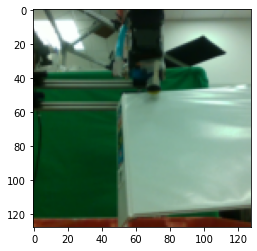

nearest images


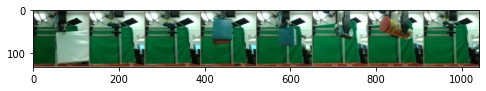

query image


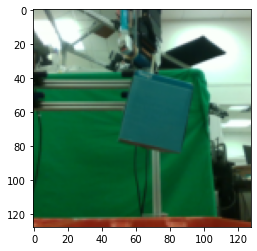

nearest images


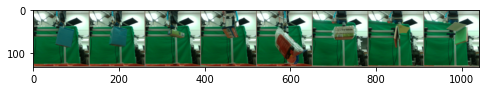

In [37]:
# get 10 nearest neighbors for a car image
for img_type in [classA, classB]:
    img = dataset[img_type[0]][0].unsqueeze(0)
    print("query image")
    imshow(torchvision.utils.make_grid(img))
    indices, distances = inference_model.get_nearest_neighbors(img, k=8)
    nearest_imgs = [dataset[i][0] for i in indices[0]]
    print("nearest images")
    imshow(torchvision.utils.make_grid(nearest_imgs))

## Compare two images of the same class

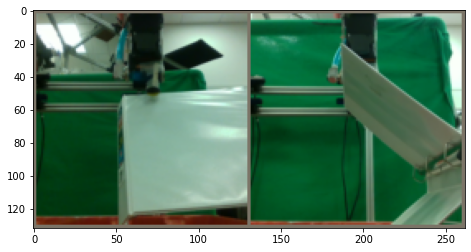

Same class


In [38]:
# compare two images of the same class
(x, _), (y, _) = dataset[classA[0]], dataset[classA[1]]
imshow(torchvision.utils.make_grid(torch.stack([x,y], dim=0)))
decision = inference_model.is_match(x.unsqueeze(0), y.unsqueeze(0))
print_decision(decision)

## Compare two images of different classes

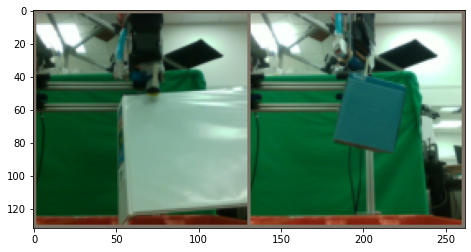

Same class


In [39]:
# compare two images of a different class
(x, _), (y, _) = dataset[classA[0]], dataset[classB[0]]
imshow(torchvision.utils.make_grid(torch.stack([x,y], dim=0)))
decision = inference_model.is_match(x.unsqueeze(0), y.unsqueeze(0))
print_decision(decision)

## Compare multiple pairs of images

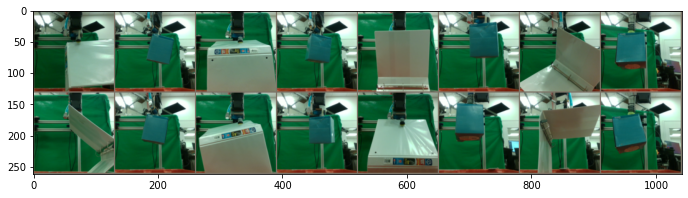

Same class
Same class
Same class
Same class
Same class
Same class
Same class
Same class
accuracy = 1.0


In [41]:
# compare multiple pairs of images
x = torch.zeros(8, 3, 128, 128)
y = torch.zeros(8, 3, 128, 128)
for i in range(0, 8, 2):
    x[i] = dataset[classA[i]][0]
    x[i+1] = dataset[classB[i]][0]
    y[i] = dataset[classA[i+1]][0]
    y[i+1] = dataset[classB[i+1]][0]
imshow(torchvision.utils.make_grid(torch.cat((x,y), dim=0), nrow=8), figsize=(30, 3))
decision = inference_model.is_match(x, y)
for d in decision:
    print_decision(d)
print("accuracy = {}".format(np.sum(decision)/len(x)))

## Compare all pairs within a batch

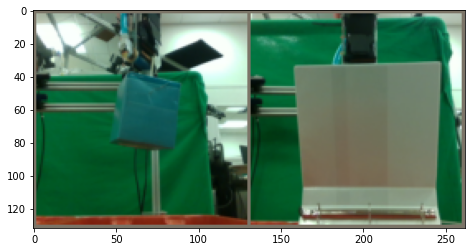

Same class


In [42]:
# compare all pairs within a batch
match_matrix = inference_model.get_matches(x)
assert match_matrix[0,0] # the 0th image should match with itself
imshow(torchvision.utils.make_grid(torch.stack((x[3],x[4]), dim=0)))
print_decision(match_matrix[3,4]) # does the 3rd image match the 4th image?

## Compare all pairs between queries and references

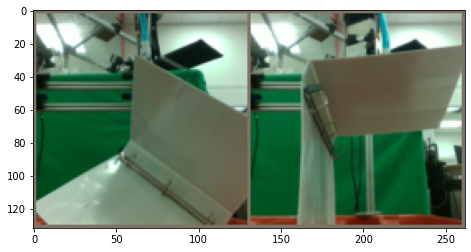

Same class


In [43]:
# compare all pairs between queries and references
match_matrix = inference_model.get_matches(x, y)
imshow(torchvision.utils.make_grid(torch.stack((x[6],y[6]), dim=0)))
print_decision(match_matrix[6, 6]) # does the 6th query match the 6th reference?

# Get results in tuple form

MATCHING IMAGE PAIRS
0 1


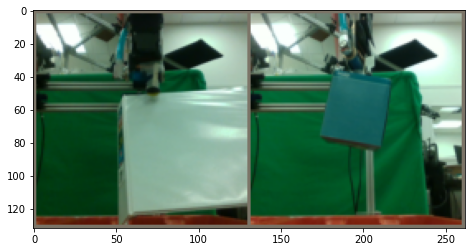

0 3


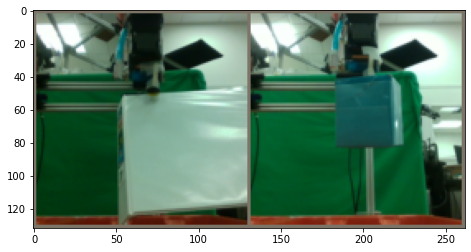

0 5


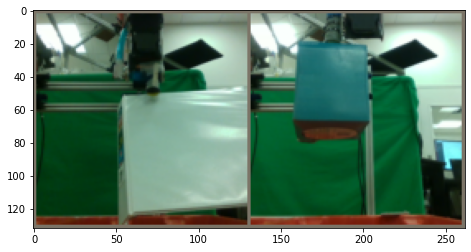

0 6


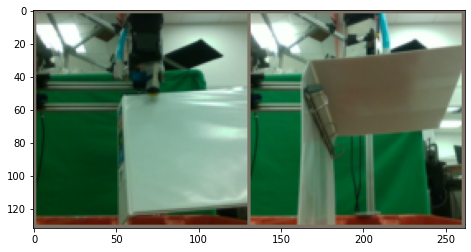

1 1


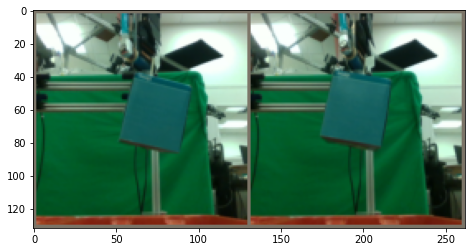

1 3


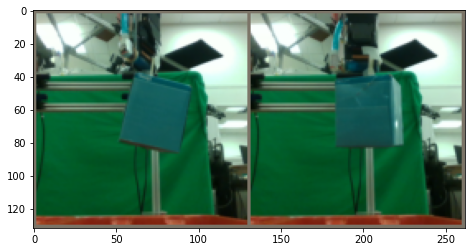

1 5


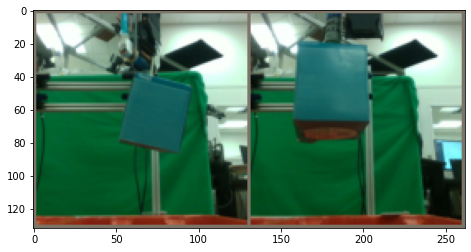

1 6


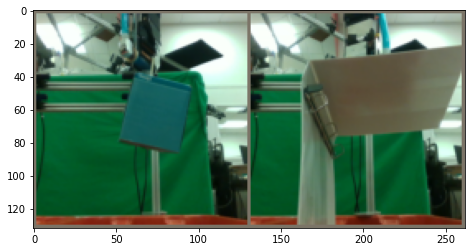

2 2


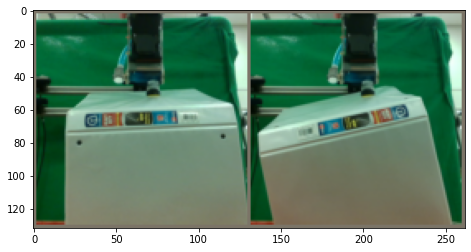

3 1


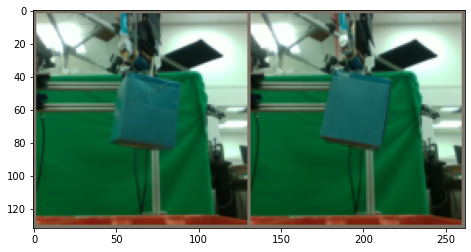

3 3


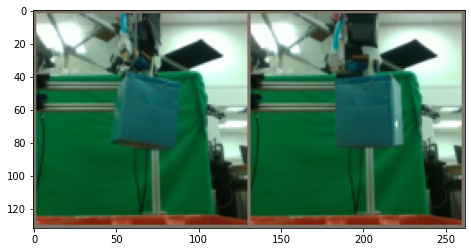

5 1


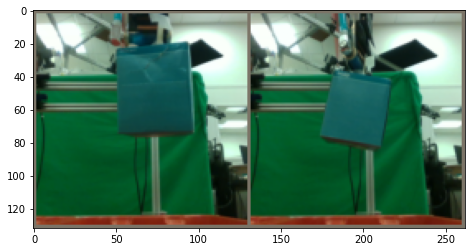

5 3


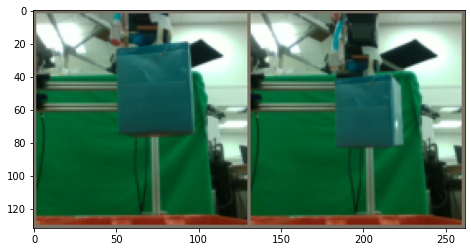

5 5


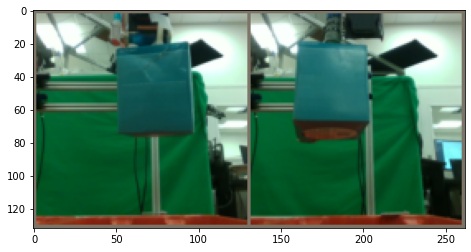

5 6


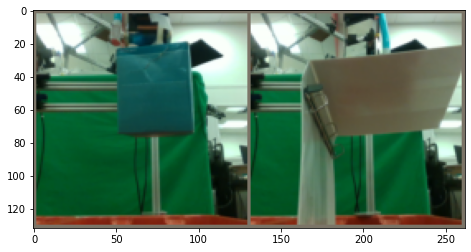

5 7


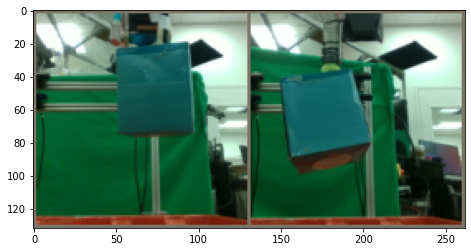

7 1


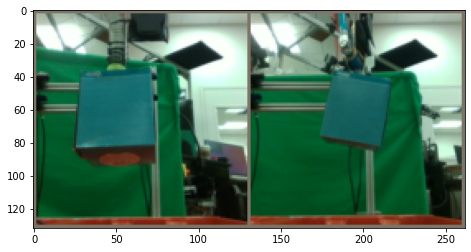

7 3


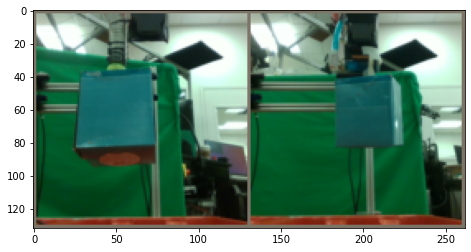

7 5


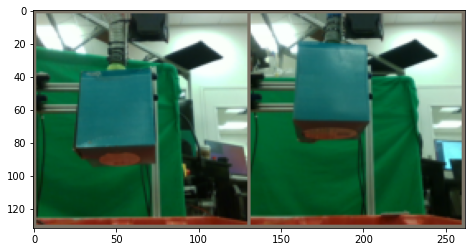

7 6


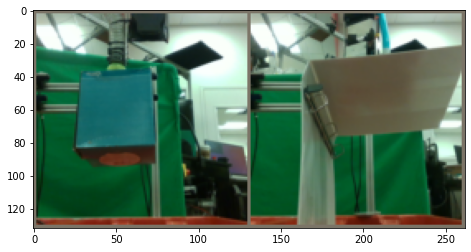

7 7


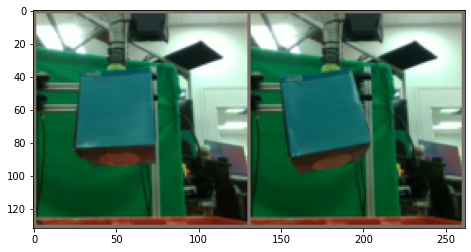

In [44]:
# make a new model with high threshold
match_finder = MatchFinder(distance=CosineSimilarity(), threshold=0.95)
inference_model = InferenceModel(trunk=trunk, embedder=embedder, match_finder=match_finder)

# get all matches in tuple form
match_tuples = inference_model.get_matches(x, y, return_tuples=True)
print("MATCHING IMAGE PAIRS")
for i,j in match_tuples:
    print(i,j)
    imshow(torchvision.utils.make_grid(torch.stack((x[i],y[j]), dim=0)))

## Load Tensorboard

In [46]:
%load_ext tensorboard
%tensorboard --logdir /content/gdrive/MyDrive/Metric_Learning/model_data/example_tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>